In [1]:
from chatbot import MainAgent, salinity_calculator, processed_mode, run_agent
import os
from dotenv import load_dotenv
from langchain_openai import ChatOpenAI 
import plotly.express as px
from langchain_core.messages import HumanMessage
import uuid
from prompt import system_prompt, few_shots

load_dotenv()
key= os.getenv("OPENAI_API_KEY")

# Initialize GPT-5 Nano
llm = ChatOpenAI(openai_api_key=key, model_name="gpt-5-mini", temperature=1 )



In [2]:
import pandas as pd

#Load the laptop product orders CSV into a Pandas dataframe.
df = pd.read_csv("/Users/piratheebanmayuran/Documents/GitHub/pira_projects/llm_projects/data/SBRO_plant_data.csv")
df.rename(columns={'time_stamp': 't_stamp'}, inplace=True)
df['t_stamp'] = pd.to_datetime(df['t_stamp'], errors='coerce', infer_datetime_format=True)
df = df.dropna(subset=['t_stamp'])
if pd.api.types.is_datetime64tz_dtype(df['t_stamp']):
    df['t_stamp'] = df['t_stamp'].dt.tz_localize(None)

/var/folders/lk/23npv5w93yvfg4q5_4b_sq7h0000gn/T/ipykernel_49632/3103545294.py:4: DtypeWarning: Columns (24) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("/Users/piratheebanmayuran/Documents/GitHub/pira_projects/llm_projects/data/SBRO_plant_data.csv")
/var/folders/lk/23npv5w93yvfg4q5_4b_sq7h0000gn/T/ipykernel_49632/3103545294.py:6: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['t_stamp'] = pd.to_datetime(df['t_stamp'], errors='coerce', infer_datetime_format=True)
/var/folders/lk/23npv5w93yvfg4q5_4b_sq7h0000gn/T/ipykernel_49632/3103545294.py:8: DeprecationWarning: is_datetime64tz_dtype is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.DatetimeTZDtype)` instead.
  if pd.api.types.is_datetim

/Users/piratheebanmayuran/Documents/GitHub/pira_projects/llm_projects/data_analysis/chatbot.py:114: LangChainDeprecationWarning: The class `OpenAIEmbeddings` was deprecated in LangChain 0.0.9 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-openai package and should be used instead. To use it run `pip install -U :class:`~langchain-openai` and import as `from :class:`~langchain_openai import OpenAIEmbeddings``.
  self.embeddings = OpenAIEmbeddings(openai_api_key=os.getenv("OPENAI_API_KEY"))


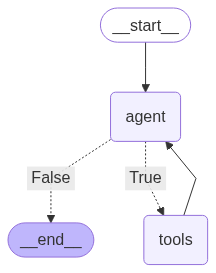

In [3]:
from IPython.display import Image


#Create the custom orders agent
main_agent = MainAgent(
    llm, 
    [salinity_calculator, processed_mode], 
    system_prompt,
    debug=False
    )

#Visualize the Agent
Image(main_agent.graph_agent.get_graph().draw_mermaid_png())

In [ ]:
user_input = "plot perm_flow against t_stamp"
config = {"configurable": {"thread_id": str(uuid.uuid4())}}

    
    # Format the user message
user_message = {"messages": [HumanMessage(user_input)]}
#user_message = HumanMessage(user_input)
    
    # Get response from the agent
ai_response = main_agent.graph_agent.invoke(user_message, config=config)

generated_code = ai_response['messages'][-1].content
print(f"\nAGENT generated code:\n{generated_code}")
exec(generated_code)

if 'df' in globals():
    print(f"\nAGENT sees the DataFrame:\n{globals()['df'].head(10)}")
    print(globals()['df'].head(10))

if 'fig' in globals():
    globals()['fig'].show()
    
    # Get the code generated by the agent


AGENT generated code:
import pandas as pd
import plotly.express as px
import sys

def load_df_if_missing():
    try:
        _ = df
    except NameError:
        path = input("DataFrame 'df' not found. Enter path to CSV to load: ").strip()
        if not path:
            raise SystemExit("No path provided. Exiting.")
        globals()['df'] = pd.read_csv(path)

def find_matches(name):
    cols = list(df.columns)
    if name in cols:
        return [name]
    lower_name = name.lower()
    exact_ci = [c for c in cols if c.lower() == lower_name]
    if exact_ci:
        return exact_ci
    name_us = name.replace(" ", "_")
    name_sp = name.replace("_", " ")
    matches = []
    matches += [c for c in cols if c == name_us]
    matches += [c for c in cols if c == name_sp]
    if matches:
        return list(dict.fromkeys(matches))
    alt_matches = [c for c in cols if c.lower() == name_us.lower() or c.lower() == name_sp.lower()]
    if alt_matches:
        return list(dict.fromkeys(alt_m